In [39]:
import pandas as pd
import numpy as np
from sklearn import model_selection
from sklearn import metrics
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt

from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

In [245]:
df=pd.read_excel("CaseStudy_Cancer.xls")

In [130]:
df.head(2)

,ID,B-M,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,...,radius-W,texture-W,perimeter-W,area-W,smoothness-W,compactness-W,concavity-W,concave points-W,Symmetry-W,fractal dimension-W
0,842302,M,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902


In [42]:
df.shape

(569, 32)

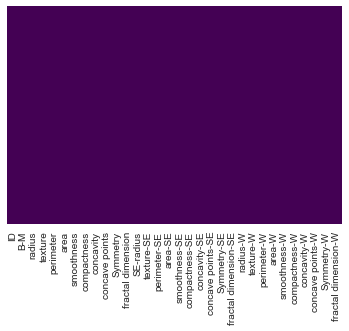

In [43]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [69]:
df[df.isnull().any(axis=1)]


,ID,B-M,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,...,radius-W,texture-W,perimeter-W,area-W,smoothness-W,compactness-W,concavity-W,concave points-W,Symmetry-W,fractal dimension-W


In [246]:
df.drop('ID',axis =1,inplace=True)
# Drop the Id sequence as that is just a random number 

In [71]:
df.dtypes

B-M                      object
radius                  float64
texture                 float64
perimeter               float64
area                    float64
smoothness              float64
compactness             float64
concavity               float64
concave points          float64
Symmetry                float64
fractal dimension       float64
SE-radius               float64
texture-SE              float64
perimeter-SE            float64
area-SE                 float64
smoothness-SE           float64
compactness-SE          float64
concavity-SE            float64
concave points-SE       float64
Symmetry-SE             float64
fractal dimension-SE    float64
radius-W                float64
texture-W               float64
perimeter-W             float64
area-W                  float64
smoothness-W            float64
compactness-W           float64
concavity-W             float64
concave points-W        float64
Symmetry-W              float64
fractal dimension-W     float64
dtype: o

In [254]:
#cleanup_nums = {"B-M":     {"M": 1, "B": 0}}
#df.replace(cleanup_nums, inplace=True)

In [255]:
#df.dtypes

In [21]:
#heat map for correlation just to know the  quantified relation between the variable
#calculate the correlation matrix
corr = df.corr()
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)


#draw the correlation table 
def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

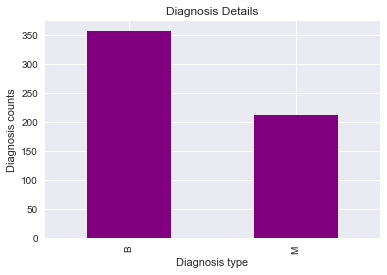

In [75]:
df['B-M'].value_counts().plot(kind='bar',color='purple')
plt.title("Diagnosis Details")
plt.ylabel('Diagnosis counts')
plt.xlabel('Diagnosis type');

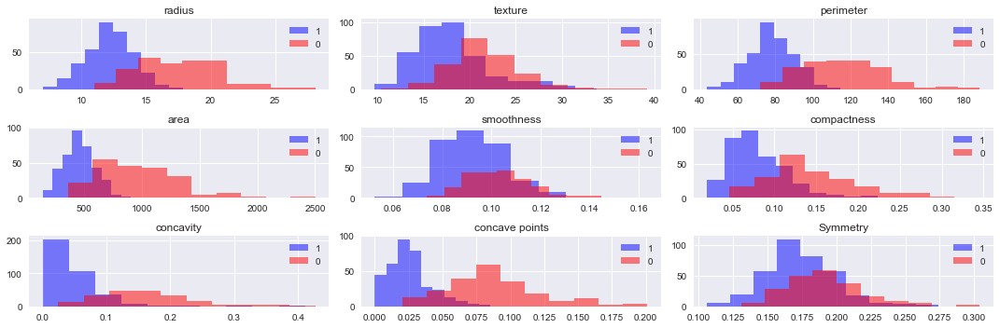

In [93]:
#Univariate graphs for each attribute grouped by class variable
fig = plt.figure()
fig.set_figheight(5)
fig.set_figwidth(15)
num_bins = 10

#radius
ax1 = fig.add_subplot(331)
ax1.hist(np.array(df[df['B-M']=='B']['radius']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['radius']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("radius")

#texture
ax1 = fig.add_subplot(332)
ax1.hist(np.array(df[df['B-M']=='B']['texture']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['texture']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("texture")

#texture
ax1 = fig.add_subplot(333)
ax1.hist(np.array(df[df['B-M']=='B']['perimeter']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['perimeter']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("perimeter")

#area
ax1 = fig.add_subplot(334)
ax1.hist(np.array(df[df['B-M']=='B']['area']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['area']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("area")

#smoothness
ax1 = fig.add_subplot(335)
ax1.hist(np.array(df[df['B-M']=='B']['smoothness']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['smoothness']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("smoothness")

#compactness
ax1 = fig.add_subplot(336)
ax1.hist(np.array(df[df['B-M']=='B']['compactness']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['compactness']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("compactness")

#concavity
ax1 = fig.add_subplot(337)
ax1.hist(np.array(df[df['B-M']=='B']['concavity']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['concavity']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("concavity")

#concave points
ax1 = fig.add_subplot(338)
ax1.hist(np.array(df[df['B-M']=='B']['concave points']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['concave points']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("concave points")

#Symmetry
ax1 = fig.add_subplot(339)
ax1.hist(np.array(df[df['B-M']=='B']['Symmetry']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['Symmetry']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("Symmetry")

plt.tight_layout()
plt.show()

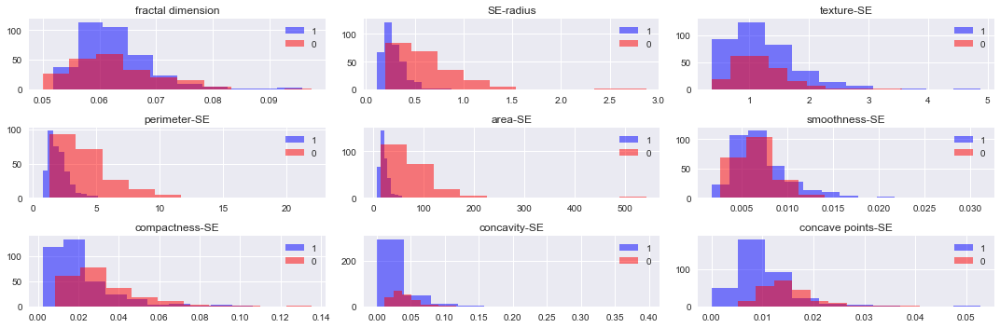

In [99]:
#Univariate graphs for each attribute grouped by class variable
fig = plt.figure()
fig.set_figheight(5)
fig.set_figwidth(15)
num_bins = 10

#fractal dimension
ax1 = fig.add_subplot(331)
ax1.hist(np.array(df[df['B-M']=='B']['fractal dimension']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['fractal dimension']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("fractal dimension")

#SE-radius
ax1 = fig.add_subplot(332)
ax1.hist(np.array(df[df['B-M']=='B']['SE-radius']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['SE-radius']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("SE-radius")

#texture-SE
ax1 = fig.add_subplot(333)
ax1.hist(np.array(df[df['B-M']=='B']['texture-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['texture-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("texture-SE")

#perimeter-SE
ax1 = fig.add_subplot(334)
ax1.hist(np.array(df[df['B-M']=='B']['perimeter-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['perimeter-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("perimeter-SE")

#area-SE
ax1 = fig.add_subplot(335)
ax1.hist(np.array(df[df['B-M']=='B']['area-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['area-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("area-SE")

#smoothness-SE
ax1 = fig.add_subplot(336)
ax1.hist(np.array(df[df['B-M']=='B']['smoothness-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['smoothness-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("smoothness-SE")

#compactness-SE
ax1 = fig.add_subplot(337)
ax1.hist(np.array(df[df['B-M']=='B']['compactness-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['compactness-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("compactness-SE")

#concavity-SE
ax1 = fig.add_subplot(338)
ax1.hist(np.array(df[df['B-M']=='B']['concavity-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['concavity-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("concavity-SE")

#concave points-SE
ax1 = fig.add_subplot(339)
ax1.hist(np.array(df[df['B-M']=='B']['concave points-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['concave points-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("concave points-SE")

plt.tight_layout()
plt.show()

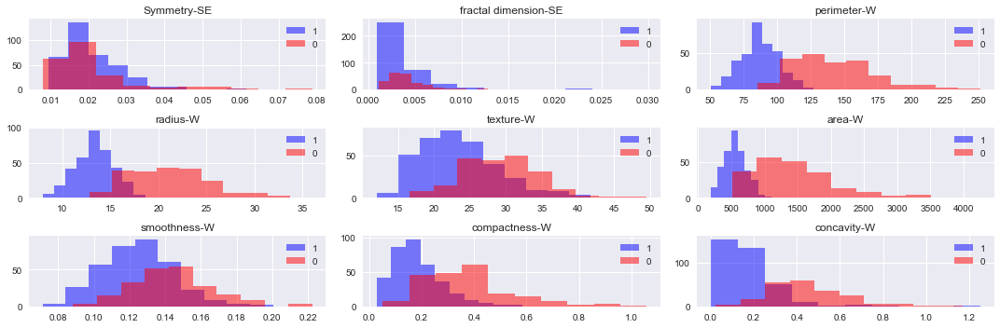

In [101]:
#Univariate graphs for each attribute grouped by class variable
fig = plt.figure()
fig.set_figheight(5)
fig.set_figwidth(15)
num_bins = 10

#Symmetry-SE
ax1 = fig.add_subplot(331)
ax1.hist(np.array(df[df['B-M']=='B']['Symmetry-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['Symmetry-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("Symmetry-SE")

#fractal dimension-SE
ax1 = fig.add_subplot(332)
ax1.hist(np.array(df[df['B-M']=='B']['fractal dimension-SE']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['fractal dimension-SE']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("fractal dimension-SE")

#perimeter-W
ax1 = fig.add_subplot(333)
ax1.hist(np.array(df[df['B-M']=='B']['perimeter-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['perimeter-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("perimeter-W")

#radius-W
ax1 = fig.add_subplot(334)
ax1.hist(np.array(df[df['B-M']=='B']['radius-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['radius-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("radius-W")

#texture-W
ax1 = fig.add_subplot(335)
ax1.hist(np.array(df[df['B-M']=='B']['texture-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['texture-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("texture-W")

#area-W
ax1 = fig.add_subplot(336)
ax1.hist(np.array(df[df['B-M']=='B']['area-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['area-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("area-W")

#smoothness-W
ax1 = fig.add_subplot(337)
ax1.hist(np.array(df[df['B-M']=='B']['smoothness-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['smoothness-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("smoothness-W")

#compactness-W
ax1 = fig.add_subplot(338)
ax1.hist(np.array(df[df['B-M']=='B']['compactness-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['compactness-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("compactness-W")

#concavity-W
ax1 = fig.add_subplot(339)
ax1.hist(np.array(df[df['B-M']=='B']['concavity-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['concavity-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("concavity-W")

plt.tight_layout()
plt.show()

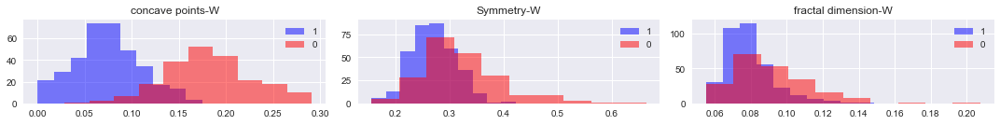

In [102]:
#Univariate graphs for each attribute grouped by class variable
fig = plt.figure()
fig.set_figheight(5)
fig.set_figwidth(15)
num_bins = 10

#concave points-W
ax1 = fig.add_subplot(331)
ax1.hist(np.array(df[df['B-M']=='B']['concave points-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['concave points-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("concave points-W")

#fractal dimension-SE
ax1 = fig.add_subplot(332)
ax1.hist(np.array(df[df['B-M']=='B']['Symmetry-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['Symmetry-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("Symmetry-W")

#perimeter-W
ax1 = fig.add_subplot(333)
ax1.hist(np.array(df[df['B-M']=='B']['fractal dimension-W']), num_bins, normed=0, facecolor='blue', alpha=0.5,label="1")
ax1.hist(np.array(df[df['B-M']=='M']['fractal dimension-W']), num_bins, normed=0, facecolor='red', alpha=0.5,label="0")
plt.legend(loc='upper right')
plt.title("fractal dimension-W")

plt.tight_layout()
plt.show()

# Now from these histograms we see that features like- mean fractal dimension has very little role to play in discerning malignant from benign, but worst concave points or worst perimeter are useful features that can give us strong hint about the classes of this cancer data-set. Histogram plots are essential as they are often used to separate models. I couldn’t resist the temptation to bring it up here. So if your data has only one feature e.g. worst perimeter, it can be good enough to separate malignant from benign case. 

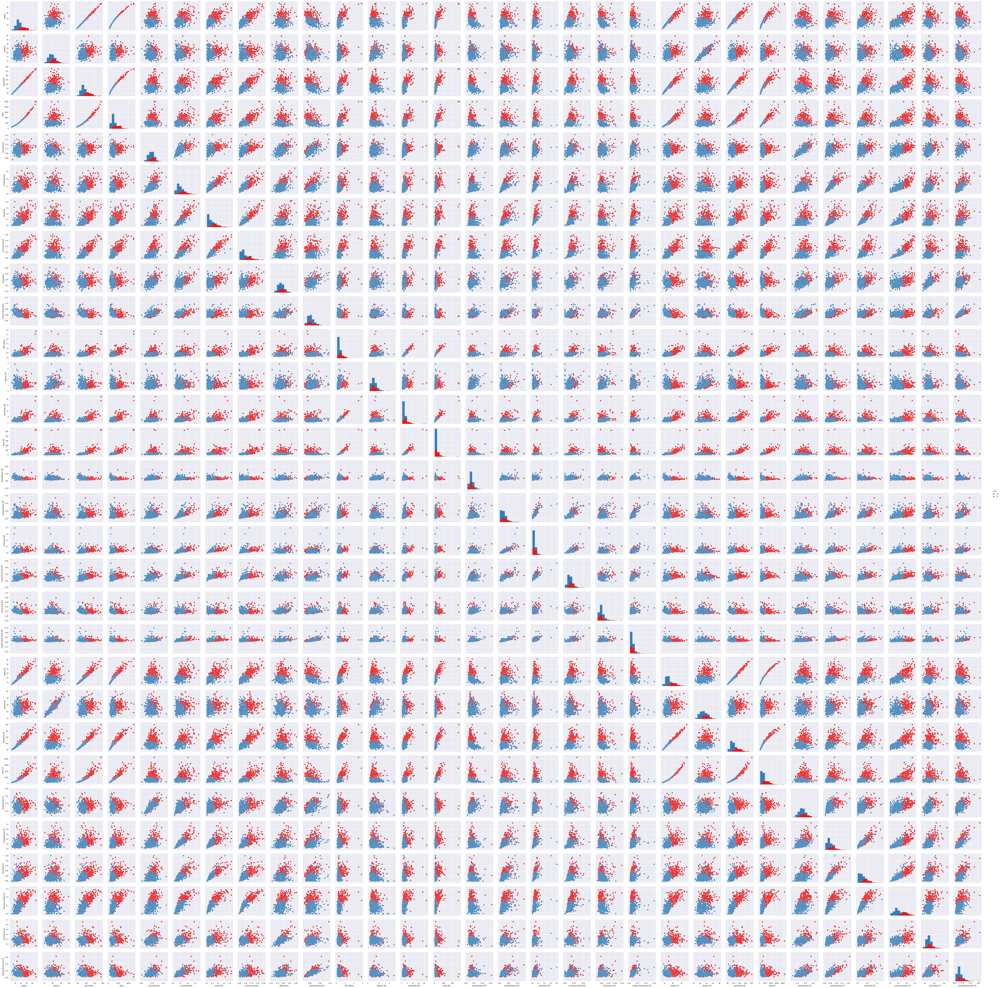

In [103]:
sns.pairplot(df,hue='B-M',palette='Set1')

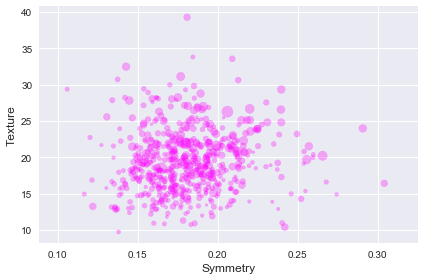

In [250]:
plt.scatter(df['Symmetry'], df['texture'],s=df['area']*0.05, color='magenta', label='check', alpha=0.3)
plt.xlabel('Symmetry',fontsize=12)
plt.ylabel('Texture',fontsize=12)
plt.tight_layout()
plt.show()

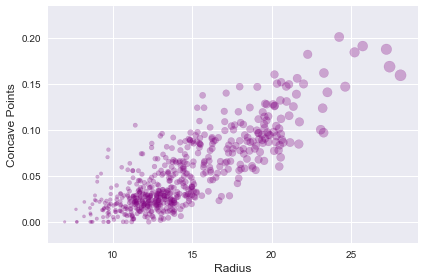

In [252]:
plt.scatter(df['radius'], df['concave points'], s=df['area']*0.05, color='purple', label='check', alpha=0.3)
plt.xlabel('Radius',fontsize=12)
plt.ylabel('Concave Points',fontsize=12)
plt.tight_layout()
plt.show()

In [133]:
cleanup_nums = {"B-M":     {"M": 1, "B": 0}}
df.replace(cleanup_nums, inplace=True)

In [134]:
# Split the data into training and test set in the ratio of 70:30
n=df['B-M'].count()
train_set = df.head(int(round(n*0.7))) 
test_set = df.tail(int(round(n*0.3)))

# capture the target column ("class") into separate vectors for training set and test set
train_labels = train_set.pop("B-M")
test_labels = test_set.pop("B-M")

In [135]:
# Create the model using entropy method of reducing the entropy and fit it to training data
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(criterion = 'entropy' )

In [136]:
#Fit the model
dt_model.fit(train_set, train_labels)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [137]:
# Test the model on test data
dt_model.score(test_set , test_labels)

0.935672514619883

In [138]:
#7. Test the model on test data
dt_model.score(test_set , test_labels)

0.935672514619883

In [139]:
test_pred = dt_model.predict(test_set)
y_grid = (np.column_stack([test_pred, test_labels]))

In [140]:
#Generate Cross tab
result = pd.DataFrame(y_grid)
result.columns= ["Predicted","Actual"]
pd.crosstab(result.Predicted,result.Actual, margins = True)

Actual,0,1,All
Predicted,,,
0,122,1,123
1,10,38,48
All,132,39,171


In [141]:
from IPython.display import Image  
from sklearn import tree
from os import system
train_char_label = ['No', 'Yes']
Cancer_Tree_File = open('Cancer_tree.dot','w')
dot_data = tree.export_graphviz(dt_model, out_file=Cancer_Tree_File, feature_names = list(train_set), class_names = list(train_char_label))

Cancer_Tree_File.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = train_set.columns))

                           Imp
radius                0.000000
texture               0.042109
perimeter             0.000000
area                  0.000000
smoothness            0.000000
compactness           0.000000
concavity             0.000000
concave points        0.000000
Symmetry              0.000000
fractal dimension     0.000000
SE-radius             0.021081
texture-SE            0.000000
perimeter-SE          0.000000
area-SE               0.000000
smoothness-SE         0.013958
compactness-SE        0.009267
concavity-SE          0.000000
concave points-SE     0.000000
Symmetry-SE           0.000000
fractal dimension-SE  0.012299
radius-W              0.000000
texture-W             0.046149
perimeter-W           0.691598
area-W                0.000000
smoothness-W          0.060368
compactness-W         0.000000
concavity-W           0.000000
concave points-W      0.092995
Symmetry-W            0.010176
fractal dimension-W   0.000000


# #Would you get the same result if you recreate the training and test data using random function?

In [142]:
from sklearn.model_selection import train_test_split
X = df.drop(['B-M'], axis=1)
Y = df[['B-M']]
test_size = 0.30
seed = 7  
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

In [143]:
# Use regularization parameters of max_depth, min_sample_leaf to recreate the model. What is the impact on the model accuracy. How does regularization help? Implement the same using Random Forest.
cancer_model = DecisionTreeClassifier(criterion = 'entropy', class_weight={0:.80,1:.20}, max_depth = 9, min_samples_leaf=5 )

In [144]:
cancer_model.fit(X_train,y_train)


DecisionTreeClassifier(class_weight={0: 0.8, 1: 0.2}, criterion='entropy',
            max_depth=9, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [145]:
cancer_model.score(X_test, y_test)


0.9181286549707602

In [146]:
predictions = cancer_model.predict(X_test)
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(y_test,predictions))

             precision    recall  f1-score   support

          0       0.91      0.97      0.94       116
          1       0.94      0.80      0.86        55

avg / total       0.92      0.92      0.92       171



In [147]:
print(confusion_matrix(y_test,predictions))


[[113   3]
 [ 11  44]]


# Test results are not the same when training and test data are recreated using random function as accuracy score has come down

# -----------------iteration2--------------

In [148]:
from sklearn import preprocessing

X_train_scaled = preprocessing.scale(X_train)
X_test_scaled = preprocessing.scale(X_test)

In [149]:
dt_model2 = DecisionTreeClassifier(criterion = 'entropy', class_weight={0:.5,1:.5}, max_depth = 5, min_samples_leaf=5 )
dt_model2.fit(train_set, train_labels)

DecisionTreeClassifier(class_weight={0: 0.5, 1: 0.5}, criterion='entropy',
            max_depth=5, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [150]:
Cancer_tree_regularized = open('Cancer_tree_regularized.dot','w')
dot_data = tree.export_graphviz(dt_model2, out_file= Cancer_tree_regularized , feature_names = list(train_set), class_names = list(train_char_label))

Cancer_tree_regularized.close()

print (pd.DataFrame(dt_model2.feature_importances_, columns = ["Imp"], index = train_set.columns))

                           Imp
radius                0.004991
texture               0.044004
perimeter             0.000000
area                  0.000000
smoothness            0.000000
compactness           0.000000
concavity             0.000000
concave points        0.003256
Symmetry              0.000000
fractal dimension     0.000000
SE-radius             0.000000
texture-SE            0.000000
perimeter-SE          0.019796
area-SE               0.000000
smoothness-SE         0.000000
compactness-SE        0.000000
concavity-SE          0.000000
concave points-SE     0.000000
Symmetry-SE           0.000000
fractal dimension-SE  0.000000
radius-W              0.000000
texture-W             0.048188
perimeter-W           0.722723
area-W                0.000000
smoothness-W          0.063085
compactness-W         0.000000
concavity-W           0.000000
concave points-W      0.093958
Symmetry-W            0.000000
fractal dimension-W   0.000000


In [151]:
test_pred = dt_model2.predict(test_set)
dt_model2.score(test_set , test_labels)
#There is not much improvement

0.935672514619883

# ----------------random forest---------------

In [155]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(criterion = 'entropy', class_weight={0:.5,1:.5}, max_depth = 5, min_samples_leaf=5)
rfcl = rfcl.fit(train_set, train_labels)

In [156]:
test_pred = rfcl.predict(test_set)
rfcl.score(test_set , test_labels)

0.9649122807017544

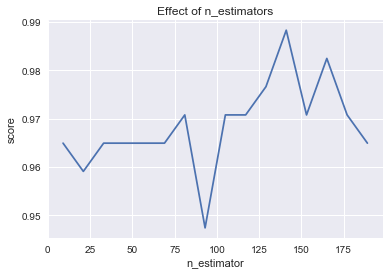

In [157]:
#10.What is the optimal number of trees that gives the best result?
model = RandomForestClassifier(n_jobs=-1, criterion = 'entropy')

estimators = np.arange(9, 201, 12)
scores = []
for n in estimators:
    model.set_params(n_estimators=n)
    model.fit(train_set, train_labels)
    scores.append(model.score(test_set, test_labels))
plt.title("Effect of n_estimators")
plt.xlabel("n_estimator")
plt.ylabel("score")
plt.plot(estimators, scores)
plt.show()

In [158]:
tree_array = [estimators,scores]
trees = pd.DataFrame(tree_array).transpose()
trees.columns = ["Trees","Scores"]
trees

,Trees,Scores
0,9.0,0.964912
1,21.0,0.959064
2,33.0,0.964912
3,45.0,0.964912
4,57.0,0.964912
5,69.0,0.964912
6,81.0,0.970760
7,93.0,0.947368
8,105.0,0.970760
9,117.0,0.970760


In [159]:
rf_model = RandomForestClassifier(n_estimators = 350, criterion = 'entropy')
rf_model = rf_model.fit(train_set, train_labels)
test_pred = rf_model.predict(test_set)
rf_model.score(test_set , test_labels)

0.9649122807017544

# ----------------Ensemble--------------

In [160]:
from sklearn.ensemble import RandomForestClassifier

In [161]:
rfc = RandomForestClassifier(n_estimators=100)

In [162]:
rfc.fit(X_train,y_train)

C:\Users\bojha\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if __name__ == '__main__':


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [163]:
predictions = rfc.predict(X_test)

In [164]:
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(y_test,predictions))

             precision    recall  f1-score   support

          0       0.98      1.00      0.99       116
          1       1.00      0.96      0.98        55

avg / total       0.99      0.99      0.99       171



In [165]:
print(confusion_matrix(y_test,predictions))

[[116   0]
 [  2  53]]


In [166]:
rfc.score(X_test, y_test)

0.9883040935672515

In [172]:
lrcl = LogisticRegression(random_state=1)
rfcl = RandomForestClassifier(random_state=1)
nbcl = GaussianNB()
bgcl = BaggingClassifier(base_estimator=cancer_model, n_estimators=90)  #the base_estimator can be null. The bagging classifer  will build it's own tree

enclf = VotingClassifier(estimators = [('lor', lrcl), ('rf', rfcl), ('nb', nbcl), ('bg', bgcl)], voting = 'hard')

In [173]:
import warnings
warnings.filterwarnings('ignore')
for clf, label in zip([lrcl , rfcl, nbcl, enclf, bgcl], ['Logistic Regression', 'RandomForest', 'NaiveBayes', 'Ensemble', 'Bagging']):
    scores = cross_val_score(clf, X, Y, cv=5, scoring='accuracy')
    print("Accuracy: %0.02f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label ))

Accuracy: 0.95 (+/- 0.02) [Logistic Regression]
Accuracy: 0.95 (+/- 0.02) [RandomForest]
Accuracy: 0.94 (+/- 0.02) [NaiveBayes]
Accuracy: 0.95 (+/- 0.02) [Ensemble]
Accuracy: 0.95 (+/- 0.02) [Bagging]


In [253]:
y_train = np.ravel(y_train)   # converting y_train vector to single dimensional array
rfcl = RandomForestClassifier(random_state=1)

bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=20)  #the base_estimator can be null.
#The bagging classifer  will build it's own tree

enclf = VotingClassifier(estimators = [('rf', rfcl), ('bg', bgcl)], voting = 'hard')

for clf, label in zip([rfcl, enclf, bgcl], ['RandomForest', 'Ensemble', 'Bagging']):
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    print(metrics.classification_report(y_test, y_predict))

             precision    recall  f1-score   support

          0       0.95      0.97      0.96       116
          1       0.94      0.89      0.92        55

avg / total       0.95      0.95      0.95       171

             precision    recall  f1-score   support

          0       0.94      0.99      0.97       116
          1       0.98      0.87      0.92        55

avg / total       0.95      0.95      0.95       171

             precision    recall  f1-score   support

          0       0.95      0.97      0.96       116
          1       0.94      0.89      0.92        55

avg / total       0.95      0.95      0.95       171



# As we have seen, Both RF and Ensemble techniques performed better than single classifiers. This is due to:

Single classifiers tend to have "High Variance". Combining multiple classifiers, the variance comes down resulting in better stable models. Voting is one of the simplest ways of combining the predictions from multiple machine learning algorithms.Voting classifier does even better than other classifier. In RF,ensemble of the same type of CART. However, when we created a Voting clasisfier, we combine different types of models -linear models and non linear models.RF is like a bootstraping algorithm so it have power of handle large dataset with higher dimesionality.It can handle 1000 of i/p variables and identifies most significant variable so it's considered as one of the dimension reduction method

# APPLYING PCA

# 1.Standardize​ ​the d-dimensional​ ​dataset.

In [176]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import zscore

In [177]:
df.head(2)

,B-M,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,Symmetry,...,radius-W,texture-W,perimeter-W,area-W,smoothness-W,compactness-W,concavity-W,concave points-W,Symmetry-W,fractal dimension-W
0,1,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902


In [178]:
df.drop('B-M',axis =1,inplace=True)

In [179]:

cancer_data_std = StandardScaler().fit_transform(df)

In [180]:
pd.DataFrame(cancer_data_std).describe().transpose()


,count,mean,std,min,25%,50%,75%,max
0,569.0,-1.256562e-16,1.00088,-2.029648,-0.689385,-0.215082,0.469393,3.971288
1,569.0,1.049736e-16,1.00088,-2.229249,-0.725963,-0.104636,0.584176,4.651889
2,569.0,-1.272171e-16,1.00088,-1.984504,-0.691956,-0.235980,0.499677,3.976130
3,569.0,-1.900452e-16,1.00088,-1.454443,-0.667195,-0.295187,0.363507,5.250529
4,569.0,-8.226187e-16,1.00088,-3.112085,-0.710963,-0.034891,0.636199,4.770911
5,569.0,2.419467e-16,1.00088,-1.610136,-0.747086,-0.221940,0.493857,4.568425
6,569.0,-1.315097e-16,1.00088,-1.114873,-0.743748,-0.342240,0.526062,4.243589
7,569.0,-8.780323e-17,1.00088,-1.261820,-0.737944,-0.397721,0.646935,3.927930
8,569.0,1.957036e-16,1.00088,-2.744117,-0.703240,-0.071627,0.530779,4.484751
9,569.0,5.073075e-16,1.00088,-1.819865,-0.722639,-0.178279,0.470983,4.910919


# 2.Construct the co-variance Matrix

In [181]:
cov_matrix = np.cov(cancer_data_std.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00176056e+00  3.24351929e-01  9.99612069e-01  9.89095475e-01
   1.70881506e-01  5.07014640e-01  6.77955036e-01  8.23976636e-01
   1.48001350e-01 -3.12179472e-01  6.80285970e-01 -9.74887767e-02
   6.75358538e-01  7.37159198e-01 -2.22992026e-01  2.06362656e-01
   1.94545531e-01  3.76831225e-01 -1.04504545e-01 -4.27163418e-02
   9.71245907e-01  2.97530545e-01  9.66835698e-01  9.42739295e-01
   1.19826732e-01  4.14190751e-01  5.27839123e-01  7.45524434e-01
   1.64241985e-01  7.07832563e-03]
 [ 3.24351929e-01  1.00176056e+00  3.30113223e-01  3.21650988e-01
  -2.34296930e-02  2.37118951e-01  3.02950254e-01  2.93980713e-01
   7.15266864e-02 -7.65717560e-02  2.76354360e-01  3.87037830e-01
   2.82169018e-01  2.60302460e-01  6.62542133e-03  1.92312595e-01
   1.43545353e-01  1.64139495e-01  9.14323671e-03  5.45533955e-02
   3.53193674e-01  9.13650301e-01  3.58669926e-01  3.44150782e-01
   7.76398084e-02  2.78318729e-01  3.01555198e-01  2.95835766e-01
   1.05192783e-01  

# 3.Decompose​ ​the​ ​covariance​ ​matrix​ ​into​ ​its​ ​eigenvectors​ ​and​ ​eigenvalues

In [182]:
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eig_vecs)
print('\n Eigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[ 2.18902444e-01 -2.33857132e-01 -8.53124284e-03  4.14089623e-02
  -3.77863538e-02  1.87407904e-02  1.24088340e-01  7.45229622e-03
  -2.23109764e-01  9.54864432e-02  4.14714866e-02  5.10674568e-02
   1.19672116e-02 -5.95061348e-02  5.11187749e-02 -1.50583883e-01
   2.02924255e-01  1.46712338e-01 -2.25384659e-01 -7.02414091e-01
   2.11460455e-01 -2.11194013e-01 -1.31526670e-01  1.29476396e-01
   1.92264989e-02 -1.82579441e-01  9.85526942e-02 -7.29289034e-02
  -4.96986642e-02  6.85700057e-02]
 [ 1.03724578e-01 -5.97060883e-02  6.45499033e-02 -6.03050001e-01
   4.94688505e-02 -3.21788366e-02 -1.13995382e-02 -1.30674825e-01
   1.12699390e-01  2.40934066e-01 -3.02243402e-01  2.54896423e-01
   2.03461333e-01  2.15600995e-02  1.07922421e-01 -1.57841960e-01
  -3.87061187e-02 -4.11029851e-02 -2.97886446e-02 -2.73661018e-04
  -1.05339342e-02  6.58114593e-05 -1.73573093e-02  2.45566636e-02
  -8.47459309e-02  9.87867898e-02  5.54997454e-04 -9.48006326e-02
  -2.44134993e-01 -4.48

In [183]:
# Display the eigen values
print("Eigen Values:")
pd.DataFrame(eig_vals).transpose()

Eigen Values:


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,13.304991,5.701375,2.82291,1.984128,1.651633,1.209482,0.676409,0.477456,0.417629,0.351311,...,0.00075,0.001592,0.006913,0.008192,0.015509,0.018087,0.024384,0.027488,0.031214,0.030026


# Selecting k eigenvectors
4.Select k eigenvectors that correspond to the k largest eigenvalues, where k is the dimensionality of the new feature subspace (k≤d)

In [184]:
tot = sum(eig_vals)
var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 44.27202561  63.24320765  72.63637091  79.23850582  84.73427432
  88.75879636  91.00953007  92.59825387  93.98790324  95.15688143
  96.13660042  97.00713832  97.81166331  98.33502905  98.64881227
  98.91502161  99.1130184   99.28841435  99.45333965  99.55720433
  99.65711397  99.74857865  99.82971477  99.88989813  99.94150237
  99.96876117  99.99176271  99.99706051  99.99955652 100.        ]


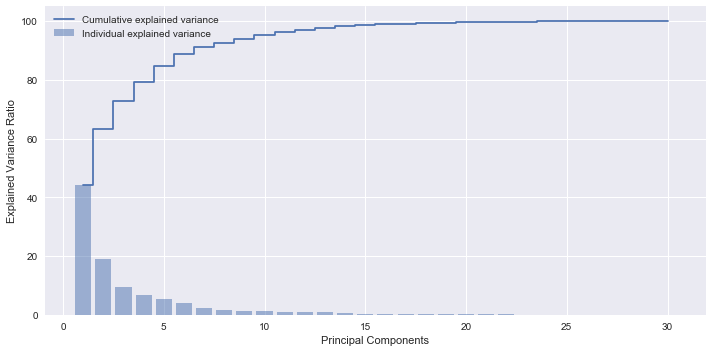

In [185]:
# Ploting 
plt.figure(figsize=(10 , 5))
plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

# Plot indicates that the first principal component accounts for around 45 percent of the variance. Also, we can see that the first two principal components combined explain almost 65 percent of the variance in the data.Also to choose Eigenvector,we see the values grater than 1 in Eigen Values. So best way out is to choose a right balance between two; Eigen value near to 1 combined with maximum variance.So Next, we collect the 5 eigenvectors that correspond to the five largest values to capture about 85 percent of the variance in this dataset. Here we only chose five eigenvectors for the purpose of dimension reduction

In [186]:
#Selecting k eigenvectors that correspond to the k largest eigenvalues, where k is the dimensionality of 
#the new feature subspace ( k≤d ).
eigen_pairs = [(np.abs(eig_vals[i]), eig_vecs[ :, i]) for i in range(len(eig_vals))]

In [187]:
# Projection Matrix


matrix_w = np.hstack((eigen_pairs[0][1].reshape(30,1), 
                      eigen_pairs[1][1].reshape(30,1),
                      eigen_pairs[2][1].reshape(30,1),
                      eigen_pairs[3][1].reshape(30,1),
                      eigen_pairs[4][1].reshape(30,1),
                     ))

print('Matrix W:\n', matrix_w)

Matrix W:
 [[ 0.21890244 -0.23385713 -0.00853124  0.04140896 -0.03778635]
 [ 0.10372458 -0.05970609  0.0645499  -0.60305     0.04946885]
 [ 0.22753729 -0.21518136 -0.00931422  0.0419831  -0.03737466]
 [ 0.22099499 -0.23107671  0.02869953  0.0534338  -0.01033125]
 [ 0.14258969  0.18611302 -0.1042919   0.15938277  0.36508853]
 [ 0.23928535  0.15189161 -0.07409157  0.03179458 -0.01170397]
 [ 0.25840048  0.06016536  0.00273384  0.01912275 -0.08637541]
 [ 0.26085376 -0.0347675  -0.02556354  0.06533594  0.04386103]
 [ 0.13816696  0.19034877 -0.04023994  0.06712498  0.30594143]
 [ 0.06436335  0.36657547 -0.02257409  0.04858676  0.04442436]
 [ 0.20597878 -0.10555215  0.26848139  0.09794124  0.1544565 ]
 [ 0.01742803  0.08997968  0.37463367 -0.35985553  0.19165051]
 [ 0.21132592 -0.08945723  0.26664537  0.08899241  0.12099022]
 [ 0.20286964 -0.15229263  0.21600653  0.10820504  0.12757443]
 [ 0.01453145  0.20443045  0.30883898  0.04466418  0.23206568]
 [ 0.17039345  0.2327159   0.15477972 -0.027

# 
Transform the d-dimensional input dataset x using the projection matrix W to obtain the new k-dimensional feature subspace.
We will use the 31×5 -dimensional projection matrix W to transform our samples onto the new subspace via the linear combination equation Y=X×W, where Y is a 569×5 matrix of our transformed samples.

In [188]:
# Projection Onto the New Feature Space

Y = cancer_data_std.dot(matrix_w)

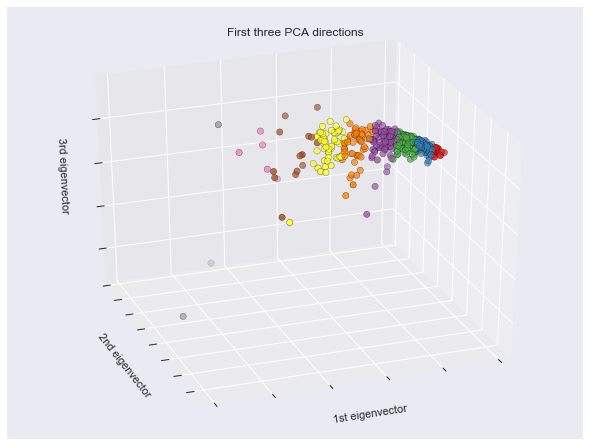

In [189]:
# There is PCA already implementation in scikit-learn. 
# I am using this to visualize the interactions between the top 3 principal components

from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
X_reduced = PCA(n_components=3).fit_transform(df)
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=df.iloc[:,0].values,
           cmap=plt.cm.Set1, edgecolor='k', s=40)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

# Steps followed to design above PCA

Begins by standardizing the data. Data on all the dimensions are subtracted from their means to shift the data points to the origin. i.e. the data is centered on the origins

Generate the covariance matrix / correlation matrix for all the dimensions

Perform eigen decomposition, that is, compute eigen vectors which are the principal components and the corresponding eigen values which are the magnitudes of variance captured

Sort the eigen pairs in descending order of eigen values and select he one with the largest value. This is the first principal component that covers the maximum information from the original data


# Here I show the correlation plot of ‘worst’ values of the features.

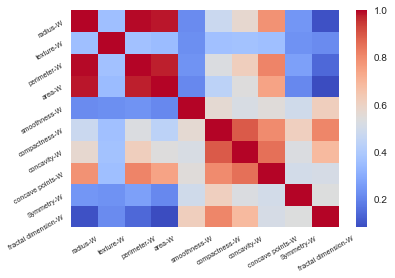

In [202]:
feature_worst=list(df.columns[20:31])# select the 'worst' features
s=sns.heatmap(df[feature_worst].corr(),cmap='coolwarm') # fantastic tool to study the features 
s.set_yticklabels(s.get_yticklabels(),rotation=30,fontsize=7)
s.set_xticklabels(s.get_xticklabels(),rotation=30,fontsize=7)
plt.show()
# no point in finding correlation between radius with perimeter and area. 

# Developing ML models on PCA

In [214]:
df=pd.read_excel("CaseStudy_Cancer.xls")
df.drop('ID',axis =1,inplace=True)
cleanup_nums = {"B-M":     {"M": 1, "B": 0}}
df.replace(cleanup_nums, inplace=True)

In [215]:
from sklearn.model_selection import train_test_split
X = df.drop(['B-M'], axis=1)
Y = df[['B-M']]
test_size = 0.30
seed = 7  
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

In [216]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [217]:
# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [230]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)

In [231]:
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [232]:
X_train = pca.transform(X_train)
X_test = pca.transform(X_test)

In [233]:
cancer_model = DecisionTreeClassifier(criterion = 'entropy', class_weight={0:.80,1:.20}, max_depth = 9, min_samples_leaf=5 )

In [234]:
cancer_model.fit(X_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.8, 1: 0.2}, criterion='entropy',
            max_depth=9, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [235]:
cancer_model.score(X_test, y_test)

0.935672514619883

In [236]:
predictions = cancer_model.predict(X_test)
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(y_test,predictions))

             precision    recall  f1-score   support

          0       0.93      0.97      0.95       116
          1       0.94      0.85      0.90        55

avg / total       0.94      0.94      0.93       171



In [237]:
print(confusion_matrix(y_test,predictions))

[[113   3]
 [  8  47]]


In [238]:
y_train = np.ravel(y_train)   # converting y_train vector to single dimensional array
rfcl = RandomForestClassifier(random_state=1)

bgcl = BaggingClassifier(base_estimator=cancer_model, n_estimators=20)  #the base_estimator can be null.
#The bagging classifer  will build it's own tree

enclf = VotingClassifier(estimators = [('rf', rfcl), ('bg', bgcl)], voting = 'hard')

for clf, label in zip([rfcl, enclf, bgcl], ['RandomForest', 'Ensemble', 'Bagging']):
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    print(metrics.classification_report(y_test, y_predict))

             precision    recall  f1-score   support

          0       0.95      0.97      0.96       116
          1       0.94      0.89      0.92        55

avg / total       0.95      0.95      0.95       171

             precision    recall  f1-score   support

          0       0.93      0.98      0.95       116
          1       0.96      0.84      0.89        55

avg / total       0.94      0.94      0.93       171

             precision    recall  f1-score   support

          0       0.92      0.97      0.95       116
          1       0.94      0.82      0.87        55

avg / total       0.92      0.92      0.92       171



In [239]:
rfcl = RandomForestClassifier(criterion = 'entropy', class_weight={0:.5,1:.5}, max_depth = 5, min_samples_leaf=5)
rfcl = rfcl.fit(X_train, y_train)

In [241]:
test_pred = rfcl.predict(X_test)
rfcl.score(X_test , y_test)

0.935672514619883

In [242]:
rf_model = RandomForestClassifier(n_estimators = 350, criterion = 'entropy')
rf_model = rf_model.fit(X_train, y_train)
test_pred = rf_model.predict(X_test)
rf_model.score(X_test , y_test)

0.9532163742690059

In [243]:
lrcl = LogisticRegression(random_state=1)
rfcl = RandomForestClassifier(random_state=1)
nbcl = GaussianNB()
bgcl = BaggingClassifier(base_estimator=cancer_model, n_estimators=90)  #the base_estimator can be null. The bagging classifer  will build it's own tree

enclf = VotingClassifier(estimators = [('lor', lrcl), ('rf', rfcl), ('nb', nbcl), ('bg', bgcl)], voting = 'hard')

In [244]:
for clf, label in zip([lrcl , rfcl, nbcl, enclf, bgcl], ['Logistic Regression', 'RandomForest', 'NaiveBayes', 'Ensemble', 'Bagging']):
    scores = cross_val_score(clf, X, Y, cv=5, scoring='accuracy')
    print("Accuracy: %0.02f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label ))

Accuracy: 0.95 (+/- 0.02) [Logistic Regression]
Accuracy: 0.95 (+/- 0.02) [RandomForest]
Accuracy: 0.94 (+/- 0.02) [NaiveBayes]
Accuracy: 0.95 (+/- 0.02) [Ensemble]
Accuracy: 0.95 (+/- 0.02) [Bagging]


# Comparing Models and advantage of PCA

Anyway, from the cancer data-set we see that it has 30 features, so let’s reduce it to only 3 principal features and then we can visualize the scatter plot of these new independent variables.

Well, I guess we got better results(more than 2%) now for Decision Tree. Let’s to examine it carefully.

The confusion matrix shows really good results this time, the DT is committing less misclassification in both classes, it can be seen though the values of the main diagonal and also the accuracy value is around 95%. It means that the classifier has 95% chance of correctly classifying a new unseen example. For classification problems, it is a not bad result at all.

Let’s think about this example: We have a dataset composed by a set of properties from cancers. These properties describe each cancer by its radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,Symmetry,fractal dimension,SE-radius and so on. However, many of these features will measure related properties and so will be redundant. Therefore, we should remove these redundancy and describe each car with less properties. This is exactly what PCA aims to do.Recall that PCA does not take information of classes into account, it just look at the variance of each feature because is reasonable assumes that features that present high variance are more likely to have a good split between classes.

Often, people end up making a mistake in thinking that PCA selects some features out of the dataset and discards others. The algorithm actually constructs new set of properties based on combination of the old ones. Mathematically speaking, PCA performs a linear transformation moving the original set of features to a new space composed by principal component. These new features does not have any real meaning for us, only algebraic, therefore do not think that combining linearly features, you will find new features that you have never thought that it could exist.

Advantage------

1-Reduced the storage space needed
2-Speed up computation
3-Remove redudant features
4-Reducing data dimension to 2D or 3D , so it may allow us to plot and visualize it
5-Too many features or too complex model can lead to overfitting

Conclusion----

Dimensionality Reduction plays a really important role in machine learning, especially when you are working with thousands of features. Principal Components Analysis are one of the top dimensionality reduction algorithm, it is not hard to understand and use it in real projects. This technique, in addition to making the work of feature manipulation easier, it still helps to improve the results of the classifier, 